# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import sweetviz
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import itertools
import re
import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode , iplot , plot
init_notebook_mode(connected = True)
import cufflinks as cf
cf.go_offline()
from pandas import Series, DataFrame

import seaborn as sns
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import xgboost
from xgboost import plot_importance

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report , confusion_matrix
import warnings
warnings.filterwarnings("ignore")

In [2]:
train_set = pd.read_csv('http://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data' , header = None)
train_set.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [3]:
test_set = pd.read_csv('http://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.test',
                       skiprows = 1 , header = None)
test_set.head()                       

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K.
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K.
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K.
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K.
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K.


In [4]:
col_labels = ['age', 'workclass', 'fnlwgt', 'education', 'education_num',
             'marital_status', 'occupation','relationship', 'race', 'sex', 'capital_gain',
             'capital_loss', 'hours_per_week', 'native_country', 'wage_class']

In [5]:
train_set.columns = col_labels

In [6]:
test_set.columns = col_labels

In [7]:
train_set.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,wage_class
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [8]:
print('Train Data - rows:' , train_set.shape[0],'columns:', train_set.shape[1])
print('-----------------------------------------------------------')
print('Test Data - rows:' , test_set.shape[0],'columns:', test_set.shape[1])

Train Data - rows: 32561 columns: 15
-----------------------------------------------------------
Test Data - rows: 16281 columns: 15


# Checking Percentage of missing data

In [9]:
total = train_set.isnull().sum().sort_values(ascending = False)
percent = (train_set.isnull().sum()/train_set.isnull().count()*100).sort_values(ascending = False)
pd.concat([total, percent], axis=1, keys=['Total', 'Percent']).transpose()

,wage_class,native_country,hours_per_week,capital_loss,capital_gain,sex,race,relationship,occupation,marital_status,education_num,education,fnlwgt,workclass,age
Total,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Percent,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Training data is clean

In [10]:
# Checking missing data in the test dataset
print("There is {} missing values in the dataframe".format(test_set.isnull().sum().sum()))

There is 0 missing values in the dataframe


In [ ]:
# test dataset is also clean

# Comparing datatypes of both training and test data

In [118]:
pd.DataFrame([train_set.dtypes, test_set.dtypes] ,index=['train_set','test_set'] ).T

,train_set,test_set
age,int64,int64
workclass,object,object
fnlwgt,int64,int64
education,object,object
education_num,int64,int64
marital_status,object,object
occupation,object,object
relationship,object,object
race,object,object
sex,object,object


In [12]:
# Checking the target variables
display(train_set['wage_class'].unique())
print("-------------------------------")

print(test_set['wage_class'].unique())

array([' <=50K', ' >50K'], dtype=object)

-------------------------------
[' <=50K.' ' >50K.']


In [14]:
n_records = train_set.shape[0]
n_greater_50k = train_set[train_set["wage_class"] == " >50K"].shape[0]
n_at_most_50k = train_set[train_set["wage_class"] == " <=50K"].shape[0]
greater_percent = (n_greater_50k / n_records) * 100
print("Total Number of records: {}".format(n_records))
print("Individuals making more than $50000: {}".format(n_greater_50k))
print("Individuals making at most $50000: {}".format(n_at_most_50k))
print("Percentage of individuals making more than $50000: {}%".format(greater_percent))

Total Number of records: 32561
Individuals making more than $50000: 7841
Individuals making at most $50000: 24720
Percentage of individuals making more than $50000: 24.080955744602438%


In [147]:
test_set.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,wage_class
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K.
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K.
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K.
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K.
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K.


In [ ]:
# Data Cleaning - Removing placeholder '?' from the dataframe

In [15]:
train_df = train_set.replace(" ?" , np.nan).dropna()

In [16]:
test_df = test_set.replace(" ?" , np.nan).dropna()

In [18]:
train_set = train_df[:]
test_set = test_df[:]

In [240]:
# Run this when something goes wrong so u dont have to run everything from above
# train_df = train_set2.copy()

In [ ]:
# test_df = test_set2.copy()

# Histogram for Age

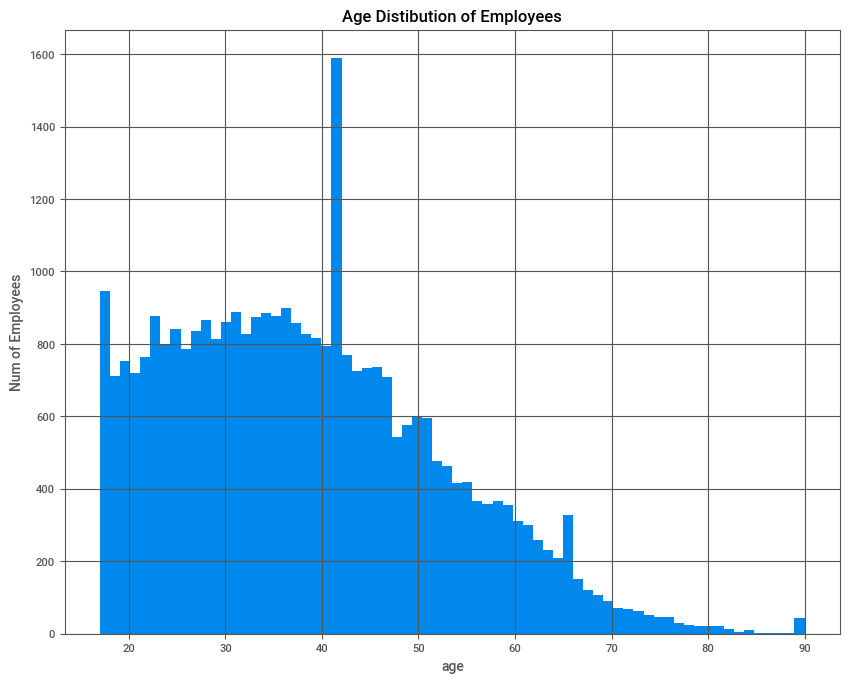

In [72]:
plt.figure(figsize=(10,8))
train_set['age'].hist(bins=70)
plt.title("Age Distibution of Employees")
plt.xlabel("age")
plt.ylabel("Num of Employees")
plt.show()

# Observation : Age of employees is rightly skewed and we also have some outliers

In [ ]:
# Exploring further Age Distibution

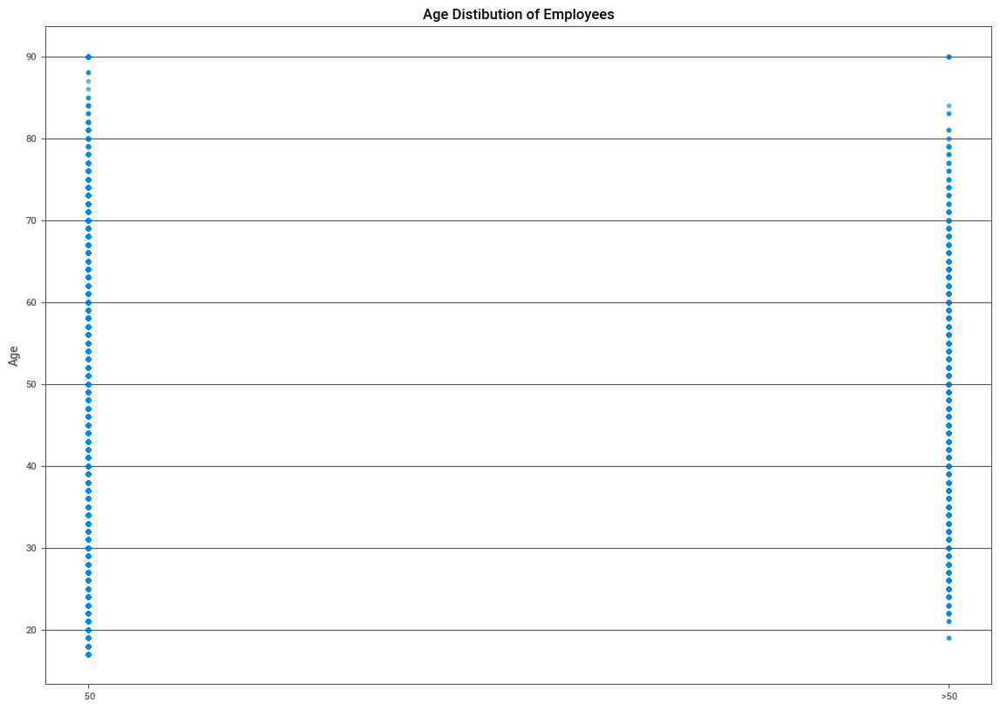

In [74]:
plt.figure(figsize=(14,10))
plt.scatter(train_set['wage_class'], train_set['age'] , alpha=.55)
plt.title("Age Distibution of Employees")
# plt.xlabel("age")
plt.ylabel("Age")
plt.grid(b=True , which = 'major', axis='y')
plt.show()

# Explore the Education columns

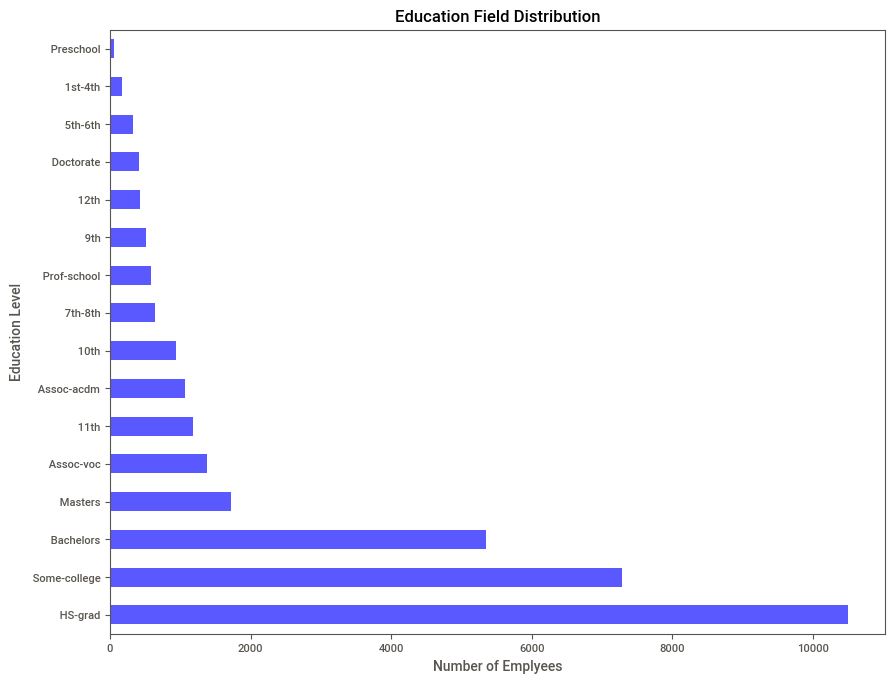

In [94]:
plt.figure(figsize=(10,8))
train_set['education'].value_counts().plot(kind='barh', color='blue',alpha=.65)
plt.title("Education Field Distribution")
plt.xlabel("Number of Emplyees")
plt.ylabel("Education Level")
plt.show()

# Explore data for Marital Status

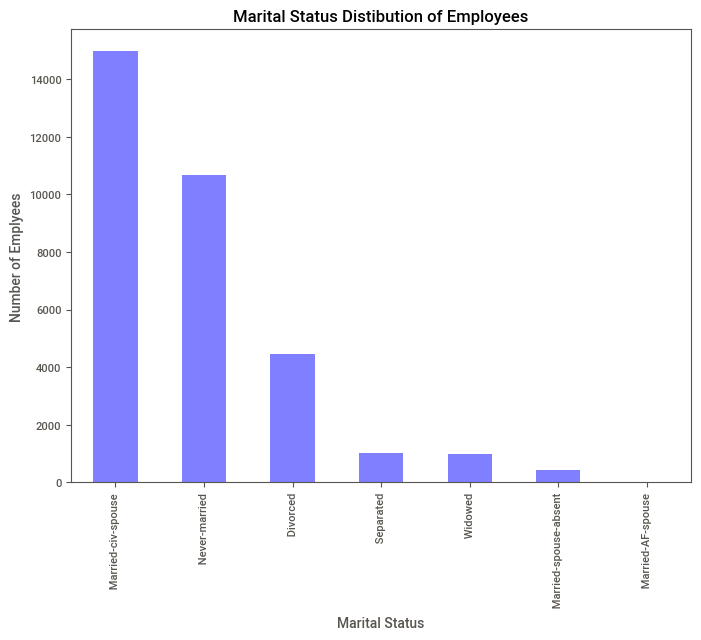

In [93]:
plt.figure(figsize=(8,6))
train_set['marital_status'].value_counts().plot(kind='bar', color='blue' , alpha=.5)
# plt.plot(kind='bar', color='b', alpha=.5)
plt.title("Marital Status Distibution of Employees")
plt.xlabel("Marital Status")
plt.ylabel("Number of Emplyees")
plt.show()

# Gender Distribution in the dataframe

In [102]:
#labels
lab = train_df["sex"].value_counts().keys().tolist()
#values
val = train_df["sex"].value_counts().values.tolist()

trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'royalblue' ,'red'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Gender distribution in data",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data = [trace]
fig = go.Figure(data = data,layout = layout)
py.iplot(fig)

![](newplot.png)

# Salary distribution between male and Female

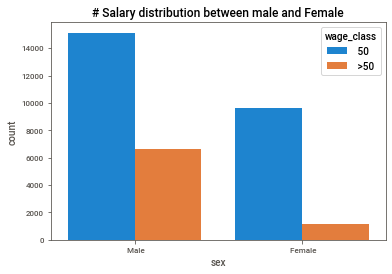

In [107]:
sns.countplot(x='sex' , hue = 'wage_class' , data = train_df)
plt.title("# Salary distribution between male and Female")
plt.show()

# Salary Distrubtion of Workclass

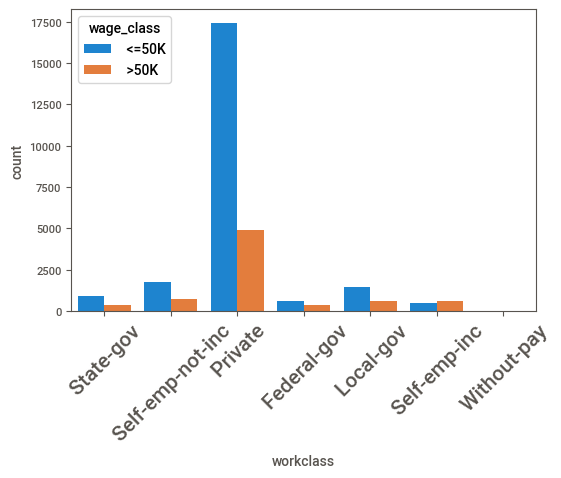

In [167]:
s = sns.countplot("workclass" , data= train_df , hue = 'wage_class')
s.set_xticklabels(s.get_xticklabels(), rotation = 45 , fontsize = 15)
plt.show()

In [ ]:
# Note : we can see we have some placeholders in the columns

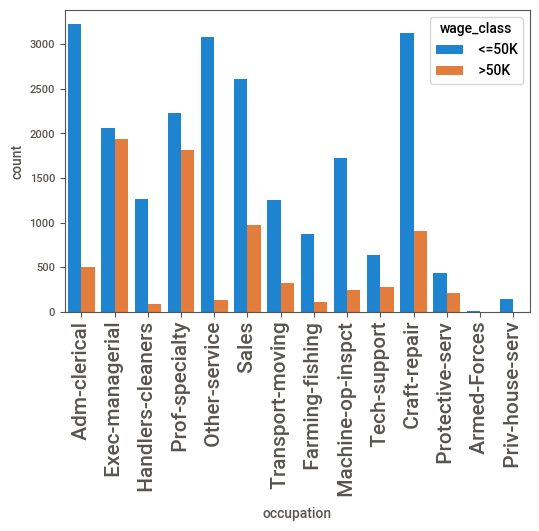

In [168]:
s = sns.countplot("occupation" , data= train_df , hue = 'wage_class')
s.set_xticklabels(s.get_xticklabels(), rotation = 'vertical' , fontsize = 15)
plt.show()

# Salary distribution based on education

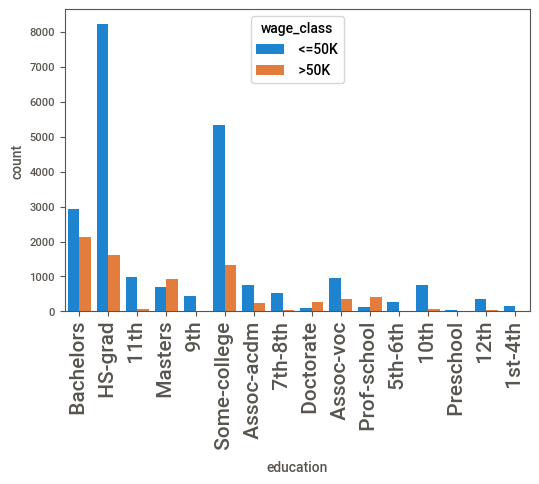

In [169]:
s = sns.countplot("education" , data= train_df , hue = 'wage_class')
s.set_xticklabels(s.get_xticklabels(), rotation = 90 , fontsize = 15)
plt.show()

# Salary Distribution , Above and Below 50k

In [170]:
#labels
lab = train_df['wage_class'].value_counts().keys().tolist()
#values
val = train_df["wage_class"].value_counts().values.tolist()

trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'royalblue' ,'red'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Wage class distribution in data",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data = [trace]
fig = go.Figure(data = data,layout = layout)
py.iplot(fig)

![](newplot(1).png)

# Age vs Wage class

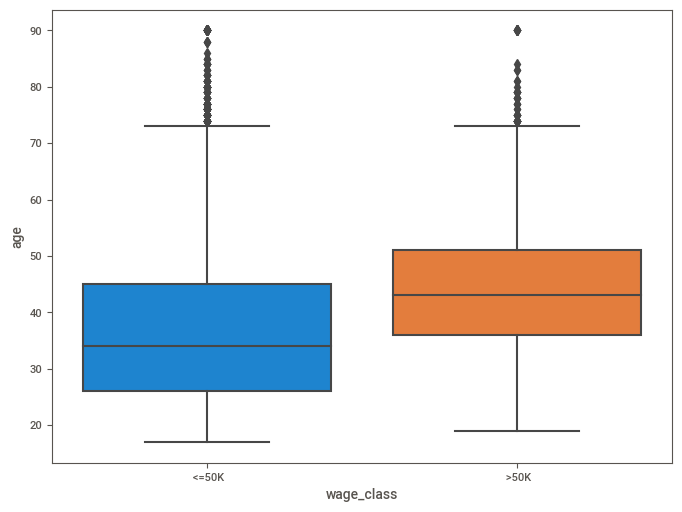

In [174]:
plt.figure(figsize = (8,6))
sns.boxplot(x='wage_class' , y = 'age' , data = train_df)
plt.show()

In [ ]:
# Salary vs Race

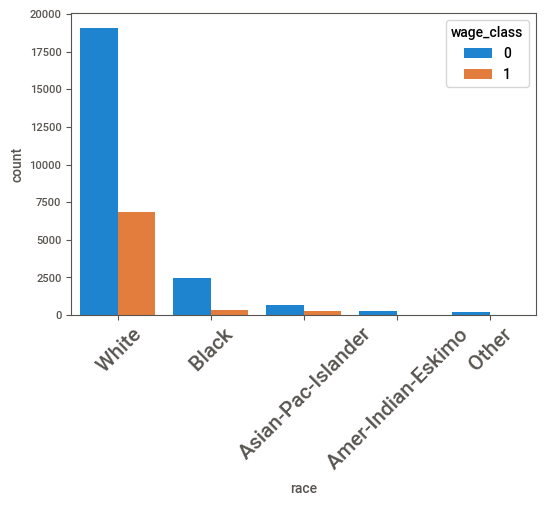

In [190]:
s = sns.countplot("race" , data= train_df , hue = 'wage_class')
s.set_xticklabels(s.get_xticklabels(), rotation = 45 , fontsize = 15)
plt.show()

# Heatmap to see the correlation among the variables

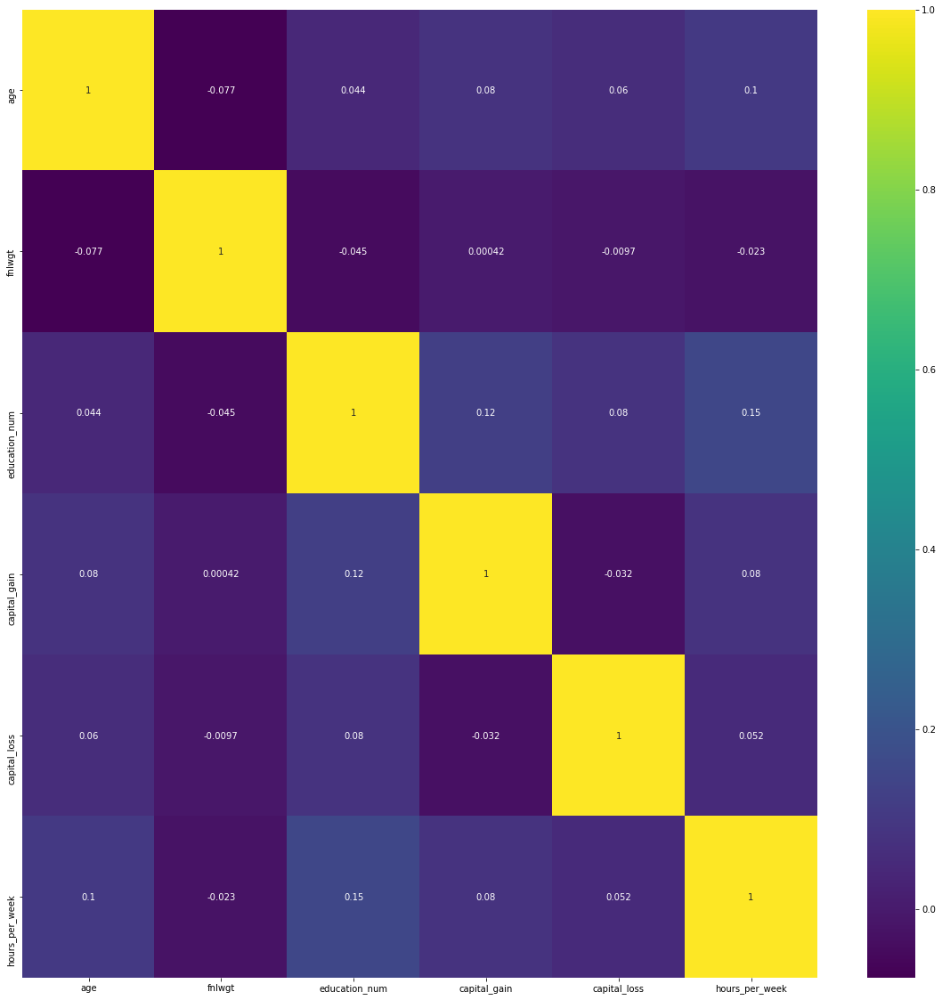

In [20]:
# get correlation of all the features of the dataset
corr_matrix = train_set.corr()
top_corr_features = corr_matrix.index

# plotting the heatmap
plt.figure(figsize=(20,20))
sns.heatmap(data=train_df[top_corr_features].corr(), annot=True, cmap="viridis");

# Feature Engineering 

In [21]:
train_set.wage_class.unique()

array([' <=50K', ' >50K'], dtype=object)

In [22]:
test_set.wage_class.unique()

array([' <=50K.', ' >50K.'], dtype=object)

# <a id="7">Target Column</a>

In [23]:
train_set["wage_class"] = train_df["wage_class"].apply(lambda x: 1 if x==" >50K" else 0)

In [25]:
test_set["wage_class"] = test_set["wage_class"].apply(lambda x: 1 if x==" >50K." else 0)

In [ ]:
# Checking results

In [26]:
train_set.wage_class.unique()

array([0, 1])

In [27]:
test_set.wage_class.unique()

array([0, 1])

# Finding all categorical columns

In [29]:
for x in train_set.columns:
    if train_set[x].dtypes == "object":
        print(x)

workclass
education
marital_status
occupation
relationship
race
sex
native_country


# How many features do our categorical variables have

In [30]:
train_set.workclass.nunique(), train_set.education.nunique(), train_set.marital_status.nunique(), train_set.native_country.nunique()

(7, 16, 7, 41)

# Train and Test Data Combination

In [31]:
X_train = train_set.copy()
X_test = test_set.copy()

# All categorical features

# <a id ='7'>Sex</a>

In [33]:
sex = {}
count = 0
for x in X_train["sex"].unique():
    sex[x] = count
    count += 1
sex    

{' Male': 0, ' Female': 1}

# <a id ='7'>Workclass</a>

In [34]:
workclass = {}
count = 0
for x in X_train["workclass"].unique():
    workclass[x] = count
    count += 1
workclass    

{' State-gov': 0,
 ' Self-emp-not-inc': 1,
 ' Private': 2,
 ' Federal-gov': 3,
 ' Local-gov': 4,
 ' Self-emp-inc': 5,
 ' Without-pay': 6}

# <a id ='7'>Education</a>

In [35]:
education = {}
count = 0
for x in X_train["education"].unique():
    education[x] = count
    count +=1
education    

{' Bachelors': 0,
 ' HS-grad': 1,
 ' 11th': 2,
 ' Masters': 3,
 ' 9th': 4,
 ' Some-college': 5,
 ' Assoc-acdm': 6,
 ' 7th-8th': 7,
 ' Doctorate': 8,
 ' Assoc-voc': 9,
 ' Prof-school': 10,
 ' 5th-6th': 11,
 ' 10th': 12,
 ' Preschool': 13,
 ' 12th': 14,
 ' 1st-4th': 15}

# <a id ='7'>Marital Status</a>

In [36]:
marital_status = {}
count = 0
for x in X_train["marital_status"].unique():
    marital_status[x] = count
    count +=1
marital_status    

{' Never-married': 0,
 ' Married-civ-spouse': 1,
 ' Divorced': 2,
 ' Married-spouse-absent': 3,
 ' Separated': 4,
 ' Married-AF-spouse': 5,
 ' Widowed': 6}

# <a id ='7'>Occupation</a>

In [37]:
occupation = {}
count = 0
for x in X_train["occupation"].unique():
    occupation[x] = count
    count += 1
occupation    

{' Adm-clerical': 0,
 ' Exec-managerial': 1,
 ' Handlers-cleaners': 2,
 ' Prof-specialty': 3,
 ' Other-service': 4,
 ' Sales': 5,
 ' Transport-moving': 6,
 ' Farming-fishing': 7,
 ' Machine-op-inspct': 8,
 ' Tech-support': 9,
 ' Craft-repair': 10,
 ' Protective-serv': 11,
 ' Armed-Forces': 12,
 ' Priv-house-serv': 13}

# <a id ='7'>Relationship</a>

In [38]:
relationship = {}
count = 0
for x in X_train["relationship"].unique():
    relationship[x] = count
    count +=1
relationship    

{' Not-in-family': 0,
 ' Husband': 1,
 ' Wife': 2,
 ' Own-child': 3,
 ' Unmarried': 4,
 ' Other-relative': 5}

# <a id ='7'>Race</a>

In [39]:
race = {}
count = 0
for x in X_train["race"].unique():
    race[x] = count
    count +=1
race    

{' White': 0,
 ' Black': 1,
 ' Asian-Pac-Islander': 2,
 ' Amer-Indian-Eskimo': 3,
 ' Other': 4}

# <a id ='7'>Native Country</a>

In [40]:
native_country = {}
count = 0
for x in X_train["native_country"].unique():
    native_country[x] = count
    count +=1
native_country    

{' United-States': 0,
 ' Cuba': 1,
 ' Jamaica': 2,
 ' India': 3,
 ' Mexico': 4,
 ' Puerto-Rico': 5,
 ' Honduras': 6,
 ' England': 7,
 ' Canada': 8,
 ' Germany': 9,
 ' Iran': 10,
 ' Philippines': 11,
 ' Poland': 12,
 ' Columbia': 13,
 ' Cambodia': 14,
 ' Thailand': 15,
 ' Ecuador': 16,
 ' Laos': 17,
 ' Taiwan': 18,
 ' Haiti': 19,
 ' Portugal': 20,
 ' Dominican-Republic': 21,
 ' El-Salvador': 22,
 ' France': 23,
 ' Guatemala': 24,
 ' Italy': 25,
 ' China': 26,
 ' South': 27,
 ' Japan': 28,
 ' Yugoslavia': 29,
 ' Peru': 30,
 ' Outlying-US(Guam-USVI-etc)': 31,
 ' Scotland': 32,
 ' Trinadad&Tobago': 33,
 ' Greece': 34,
 ' Nicaragua': 35,
 ' Vietnam': 36,
 ' Hong': 37,
 ' Ireland': 38,
 ' Hungary': 39,
 ' Holand-Netherlands': 40}

# <a id ='7'>Checking the results</a>

In [41]:
X_train.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,wage_class
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,0
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0


# <a id ='7'>Mapping numerical varialbles to the categories </a>

In [43]:
X_train["sex"] = X_train["sex"].map(sex)
X_train["education"] = X_train["education"].map(education)
X_train["native_country"] = X_train["native_country"].map(native_country)
X_train["race"] = X_train["race"].map(race)
X_train["occupation"] = X_train["occupation"].map(occupation)
X_train["marital_status"] = X_train["marital_status"].map(marital_status)
X_train["workclass"] = X_train["workclass"].map(workclass)
X_train["relationship"] = X_train["relationship"].map(relationship)

# <a id ='7'>Check results after Mapping</a>

In [44]:
X_train.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,wage_class
0,39,0,77516,0,13,0,0,0,0,0,2174,0,40,0,0
1,50,1,83311,0,13,1,1,1,0,0,0,0,13,0,0
2,38,2,215646,1,9,2,2,0,0,0,0,0,40,0,0
3,53,2,234721,2,7,1,2,1,1,0,0,0,40,0,0
4,28,2,338409,0,13,1,3,2,1,1,0,0,40,1,0


# <a id ='7'>Checking if the Target Variable is balanced or imbalanced</a>

In [45]:
X_train["wage_class"].value_counts()

0    22654
1     7508
Name: wage_class, dtype: int64

# Dealing with the Test Data

In [46]:
# Mapping the categorical columns for X_test
X_test['sex'] = X_test['sex'].map(sex)
X_test['education'] = X_test['education'].map(education)
X_test['native_country'] = X_test['native_country'].map(native_country)
X_test['race'] = X_test['race'].map(race)
X_test['occupation']=X_test['occupation'].map(occupation)
X_test['marital_status'] = X_test['marital_status'].map(marital_status)
X_test['workclass'] = X_test['workclass'].map(workclass)
X_test['relationship'] = X_test['relationship'].map(relationship)

In [47]:
# check result for the test data
X_test.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,wage_class
0,25,2,226802,2,7,0,8,3,1,0,0,0,40,0,0
1,38,2,89814,1,9,1,7,1,0,0,0,0,50,0,0
2,28,4,336951,6,12,1,11,1,0,0,0,0,40,0,1
3,44,2,160323,5,10,1,8,1,1,0,7688,0,40,0,1
5,34,2,198693,12,6,0,4,0,0,0,0,0,30,0,0


# <a id ='7'>Building the Model</a>

In [63]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report , accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb


In [51]:
x_train = X_train.drop("wage_class", 1)
y_train = X_train["wage_class"]

x_test = X_test.drop("wage_class", 1)
y_test = X_test["wage_class"]

In [58]:
X = x_train.values
y = y_train.values

Xtest = x_test.values
Ytest = y_test.values

# <a id ='7'>Trying Multiple models</a>

In [82]:
models = []

models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('SVM', SVC()))
models.append(('XGB', XGBClassifier()))
models.append(('RF', RandomForestClassifier()))

#testing models

results = []
names = []

for name, model in models:
    kfold = KFold(n_splits=5, random_state=42)
    cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    msg = '%s: %f (%f)' % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.790001 (0.001148)
LDA: 0.807440 (0.004900)
KNN: 0.767124 (0.003358)
CART: 0.803262 (0.003565)
SVM: 0.787846 (0.002567)
XGB: 0.858663 (0.003820)
RF: 0.853292 (0.003755)


# <a id ='7'>Comparing the Algorithms</a>

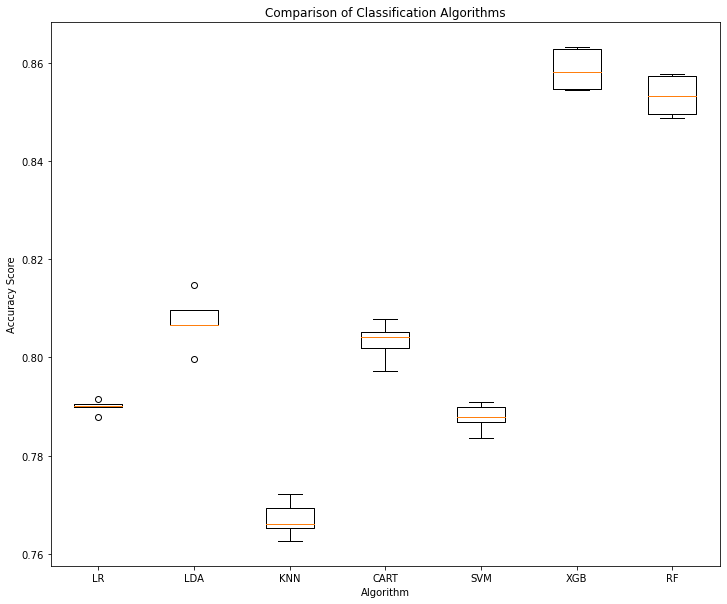

In [83]:
fig = plt.figure(figsize=(12,10))
plt.title('Comparison of Classification Algorithms')
plt.xlabel('Algorithm')
plt.ylabel('Accuracy Score')
plt.boxplot(results)
ax = fig.add_subplot(111)
ax.set_xticklabels(names)
plt.show()

# <a id ='7'>Observation</a>:
+ The highest performing model is XGBoost out of all the Algorithms

# <a id ='7'>Choosing the Model</a>

In [60]:
rf_model = RandomForestClassifier(n_estimators=10)

# Train
rf_model.fit(x_train, y_train)
# Extract single tree
estimator = rf_model.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = x_train.columns.tolist(),
                class_names = ['0',' 1'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

# <a id ='7'>RandomForestModel</a>

In [61]:
rand_model = RandomForestClassifier()
rand_model.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

# <a id ='7'>Checking Training Accuracy</a>

In [64]:
y_pred = rand_model.predict(x_train)
pred = [round(value) for value in y_pred]
accuracy_train = accuracy_score(y_train, y_pred)
accuracy_train

0.9999336913997745

# <a id ='7'>Checking testing Accuracy</a>

In [65]:
y_pred2 = rand_model.predict(x_test)
pred2 = [round(value) for value in y_pred2]
accuracy_test = accuracy_score(y_test, y_pred2)
accuracy_test

0.8494023904382471

# <a id ='7'>Classification Report</a>

In [66]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred2))

              precision    recall  f1-score   support

           0       0.88      0.93      0.90     11360
           1       0.73      0.61      0.67      3700

    accuracy                           0.85     15060
   macro avg       0.81      0.77      0.78     15060
weighted avg       0.84      0.85      0.84     15060



# <a id ='7'>Confusion Matrix</a>

In [67]:
cm = confusion_matrix(y_test, y_pred2)
cm

array([[10521,   839],
       [ 1429,  2271]])

# <a id ='7'>XGboost</a>

In [68]:
# fit model no training data
X_model = XGBClassifier(objective='binary:logistic')
X_model.fit(x_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

# <a id ='7'>Checking training accuracy</a>

In [70]:
y_pred = X_model.predict(x_train)
predictions = [round(value) for value in y_pred]
accuracy_train = accuracy_score(y_train,predictions)
accuracy_train

0.8605198594257675

# <a id ='7'>Checking testing accuracy</a>

In [72]:
y_pred2 = X_model.predict(x_test)
predictions2 = [round(value) for value in y_pred2]
accuracy_test = accuracy_score(y_test, predictions2)
accuracy_test

0.8596945551128818

In [74]:
pred_proba = X_model.predict_proba(x_test)
pred_proba

array([[0.9935404 , 0.0064596 ],
       [0.6836986 , 0.3163014 ],
       [0.7083088 , 0.29169118],
       ...,
       [0.2719642 , 0.7280358 ],
       [0.87820303, 0.12179699],
       [0.23146409, 0.7685359 ]], dtype=float32)

# <a id ='7'>Checking the classification report</a>

In [75]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions2))

              precision    recall  f1-score   support

           0       0.87      0.95      0.91     11360
           1       0.80      0.58      0.67      3700

    accuracy                           0.86     15060
   macro avg       0.84      0.76      0.79     15060
weighted avg       0.85      0.86      0.85     15060



# <a id ='7'>Confusion Matrix</a>

In [76]:
import scikitplot as skplt

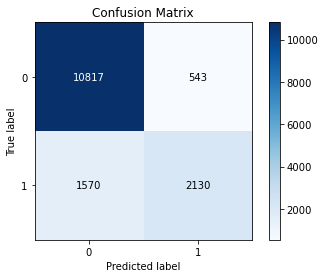

In [77]:
skplt.metrics.plot_confusion_matrix(y_test, predictions2)
plt.show()

# <a id ='7'>Creating the ROC curve</a>

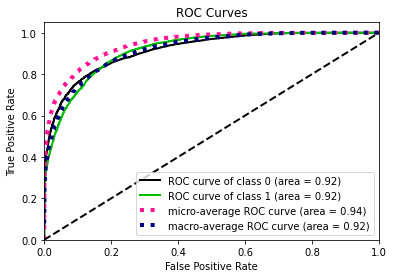

In [81]:
skplt.metrics.plot_roc_curve(y_test , pred_proba)
plt.show()

# <a id ='7'>Observations</a>:
+ I went forward with XGboost because it was the model with the best performance. 
+ Random Forest Model also had a good performance on the Accuracy however, it was overfitting.

# <a id ='7'>Hpyerparameter tuning for XGboost to Improve the performance</a>

In [84]:
params = {
    "learning_rate"    : [0.5, 0.10, 0.15, 0.20, 0.25, 0.30], 
    "max_depth"        : [3,4,5,6,8,10,12,15],
    "min_child_weight" : [1,3,5,7],
    "gamma"            : [0.0, 0.1, 0.2, 0.3, 0.4],
    "colsample_bytree" : [0.3, 0.4, 0.5, 0.7]
}

# <a id ='7'>RandomizedSearchCV</a>

In [86]:
RandomSearchCV = RandomizedSearchCV(X_model,
                                   param_distributions=params,
                                   n_iter=5,
                                   scoring="roc_auc",
                                   n_jobs=-1,
                                   cv = 5,
                                   verbose=3)

# <a id ='7'>Fit the Model</a>

In [87]:
RandomSearchCV.fit(x_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:   42.8s finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1, gamma=0,
                                           learning_rate=0.1, max_delta_step=0,
                                           max_depth=3, min_child_weight=1,
                                           missing=None, n_estimators=100,
                                           n_jobs=1, nthread=None,
                                           objective='binary:logistic',
                                           random_state=0, reg_alpha=0,
                                           reg_lambda=1, sc...
                                           verbosity=1),
                   iid='deprecated', n_iter=5, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0

# <a id ='7'>Finding the best estimator</a>

In [88]:
RandomSearchCV.best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.4, gamma=0.1,
              learning_rate=0.2, max_delta_step=0, max_depth=5,
              min_child_weight=7, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

# <a id ='7'>Finding the best parameters</a>

In [89]:
RandomSearchCV.best_params_

{'min_child_weight': 7,
 'max_depth': 5,
 'learning_rate': 0.2,
 'gamma': 0.1,
 'colsample_bytree': 0.4}

In [ ]:
# <a id ='7'>Native Country</a>

In [90]:
X_model_new = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.4, gamma=0.1,
              learning_rate=0.2, max_delta_step=0, max_depth=5,
              min_child_weight=7, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

# <a id ='7'>Cross Validation</a>

In [91]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(X_model_new, x_train,y_train, cv=5)
score

array([0.8662357 , 0.86590419, 0.87068966, 0.871187  , 0.86853448])

In [92]:
score.mean()

0.868510207563089

# <a id ='7'>CV - Accuracy Score</a>

In [93]:
cv_acc = cross_val_score(X_model_new,
                         x_train,
                         y_train,
                         cv=5,
                         scoring="accuracy")
cv_acc

array([0.8662357 , 0.86590419, 0.87068966, 0.871187  , 0.86853448])

In [94]:
cv_acc = np.mean(cv_acc)
cv_acc

0.868510207563089

# <a id ='7'>Cross-validated precision</a>

In [95]:
cv_precision = cross_val_score(X_model_new,
                         x_train,
                         y_train,
                         cv=5,
                         scoring="precision")
cv_precision

array([0.77601271, 0.78755187, 0.7827451 , 0.79867987, 0.78068092])

In [96]:
cv_precision = np.mean(cv_precision)
cv_precision

0.7851340920385759

# <a id ='7'>Cross-validated recall</a>

In [97]:
cv_recall = cross_val_score(X_model_new,
                         x_train,
                         y_train,
                         cv=5,
                         scoring="recall")
cv_recall

array([0.65046605, 0.63182423, 0.66489007, 0.6449034 , 0.65645806])

In [98]:
cv_recall = np.mean(cv_recall)
cv_recall

0.6497083613143835

# <a id="7">Cross-validated f1-score</a>

In [99]:
cv_f1 = cross_val_score(X_model_new,
                         x_train,
                         y_train,
                         cv=5,
                         scoring="f1")
cv_f1

array([0.7077146 , 0.70114518, 0.71902017, 0.71360118, 0.71320072])

In [100]:
cv_f1 = np.mean(cv_f1)
cv_f1

0.7109363702139978

# <a id ='7'>Visualise Cross Validation Metrics</a>

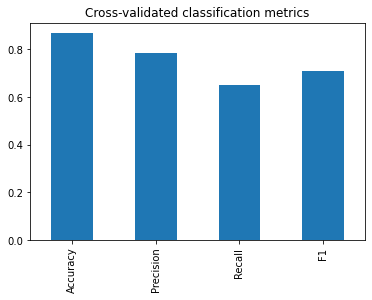

In [101]:
cv_metrics = pd.DataFrame({"Accuracy": cv_acc,
                           "Precision": cv_precision,
                           "Recall": cv_recall,
                           "F1": cv_f1},
                          index=[0])

cv_metrics.T.plot.bar(title="Cross-validated classification metrics",
                      legend=False);

# <a id ='7'>feature importance</a>

In [103]:
# fit model no training data
X_model_new1 = XGBClassifier()
X_model_new1.fit(x_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [104]:
print(X_model_new1.feature_importances_)

[0.0664577  0.02213892 0.00688482 0.01306528 0.15274477 0.24778661
 0.03775334 0.16909769 0.01289191 0.0231384  0.13435556 0.04887892
 0.05279924 0.01200699]


# <a id ='7'>Plotting feature Importance</a>

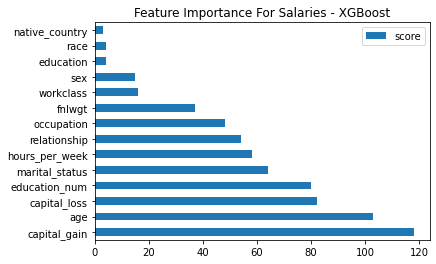

In [105]:
feature_important = X_model_new1.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
data.plot(kind='barh')
plt.title("Feature Importance For Salaries - XGBoost")
plt.show()